In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import copy
from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import Ridge

In [2]:
df = pd.read_csv("stockData.csv")
df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [3]:
def showplt(dfs,title,xaxs='Date'):
    dfs.plot(x=xaxs,figsize=(15,7),linewidth=3,title=title)
    plt.grid()
    plt.show()

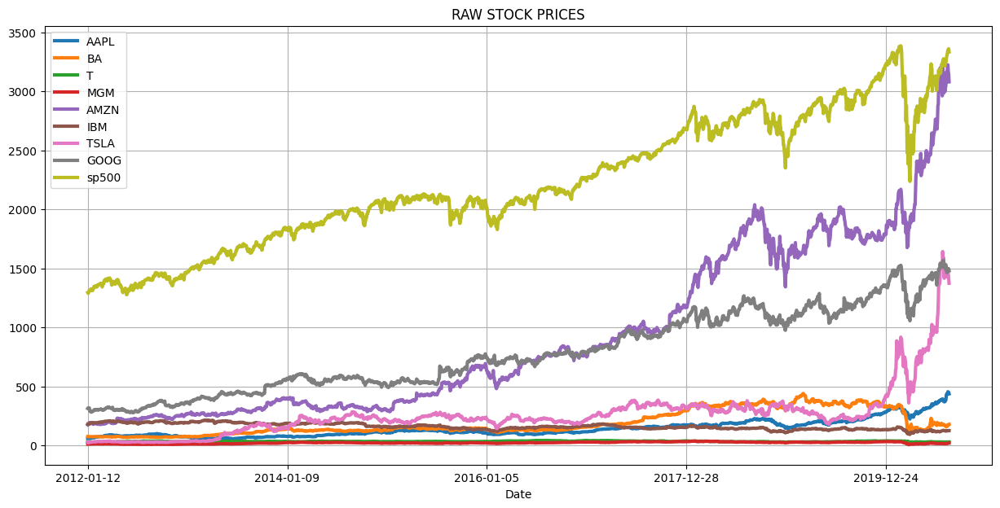

In [4]:
showplt(df,'RAW STOCK PRICES')

In [5]:
def normalize(dfs):
    x = df.copy()
    for i in x.columns[1:]:
        x[i] = x[i]/x[i][0]
    return x
    

In [6]:
ndf = normalize(df)

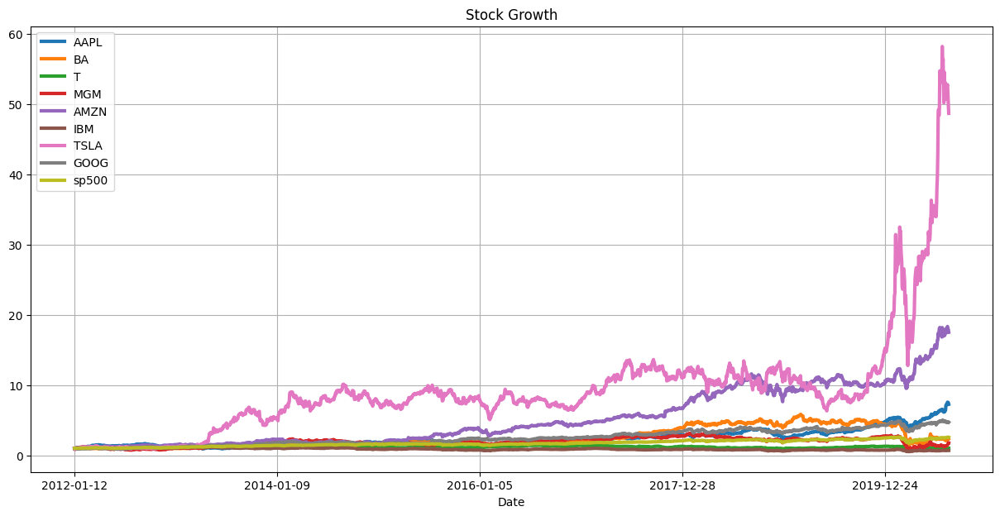

In [7]:
showplt(ndf,'Stock Growth')

In [8]:
def interactive_plt(dfs,title):
    fig = px.line(title=title)
    for i in dfs.columns[1:]:
        fig.add_scatter(x=dfs['Date'],y=dfs[i],name=i)
    fig.show()
    
    
def interactive_plot(df,title):
    fig = px.line(title=title)
    for i in df.columns[1:]:
        fig.add_scatter(x=df['Date'],y=df[i],name=i)
    fig.show()

In [9]:
def daily_return(dfs):
    df_daily_return = dfs.copy()
    for i in dfs.columns[1:]:
        for j in range(1,len(dfs)):
            df_daily_return[i][j] = ((dfs[i][j]-dfs[i][j-1])/dfs[i][j-1])*100
            df_daily_return[i][0] = 0
    return df_daily_return

In [10]:
daily_return_df = daily_return(df)
daily_return_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-13,-0.374946,-1.205144,-0.166006,1.813685,1.415339,-0.769869,-19.327430,-0.738516,-0.494792
2,2012-01-17,1.164812,0.857909,0.598603,-0.809717,1.815943,0.468852,16.717854,0.574410,0.355295
3,2012-01-18,1.038382,-0.239234,0.264463,3.918367,4.282725,0.594448,0.789470,0.688856,1.110793
4,2012-01-19,-0.316937,0.666134,0.296736,0.549882,2.644634,-0.303752,-0.186494,1.052283,0.493866
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,0.362467,5.579446,-0.533156,0.000000,2.109065,-0.309917,-0.133153,0.589774,0.642974
2155,2020-08-06,3.488923,-1.193483,-0.033501,10.406699,0.623082,0.534082,0.307062,1.797626,0.642770
2156,2020-08-07,-2.449458,-1.265966,0.603217,3.087768,-1.784187,-0.919762,-2.475194,-0.373974,0.063303
2157,2020-08-10,1.453480,5.522880,0.599604,13.767729,-0.609323,1.720552,-2.350092,0.107728,0.274222


In [11]:
interactive_plt(ndf,"Stocks Prices")

In [12]:
returns = []
for j in df.columns[1:]:
    print(j)
    returns.append(0)
    for i in range(1,len(df[j].values)):
        returns.append((df[j].values[i]-df[j].values[i-1]))
    print(returns)
        

AAPL
[0, -0.22571199999999436, 0.6985710000000012, 0.630001, -0.19428699999999566, -1.0642850000000053, 1.015712999999991, -1.0, 3.75, -0.2900009999999966, 0.3785740000000004, 0.8185700000000082, 0.4957119999999975, -0.041428000000010456, -0.1528549999999882, 0.6514279999999957, 0.6128539999999987, 0.6942910000000069, 1.121428999999992, 2.3557129999999944, 0.035713000000001216, 1.3114320000000106, 0.9799959999999999, -1.6842880000000093, 0.6485750000000081, -0.012855999999999312, 1.8185730000000007, -0.25857500000000755, 0.47856900000000735, 0.8599999999999994, 0.47857700000000136, 1.3785699999999963, 1.0042879999999883, 0.2899930000000097, 0.1014330000000001, -1.7171400000000006, -0.4142909999999915, 0.06143199999999638, 1.6142799999999937, 0.45429299999999273, 0.9757080000000116, 2.300003000000004, 3.0685730000000007, -0.5742879999999957, 0.0014269999999925176, 2.218574000000004, 0.6942829999999987, -0.49428600000000245, -0.45142300000000546, -0.47000099999999634, 1.5614240000000024,

In [13]:
dic = {}
val = 0
for i in df.columns[1:]:
    dic[i] = returns[val:val+2159]
    val+=2159

In [14]:
def pltdic(dct, title):
    x = list(dct.keys())
    y = list(dct.values())
    
    plt.plot(x, y, linewidth=3)
    plt.title(title)
    plt.xlabel("Keys")
    plt.ylabel("Values")
    plt.grid()
    plt.show()

In [15]:
for i in dic.keys():
    print(i)
    print(max(dic[i]))

AAPL
40.279998999999975
BA
31.049995999999993
T
3.140001000000005
MGM
3.0299999999999994
AMZN
234.87011699999994
IBM
12.990006000000022
TSLA
162.91992200000004
GOOG
118.29003899999998
sp500
230.3801269999999


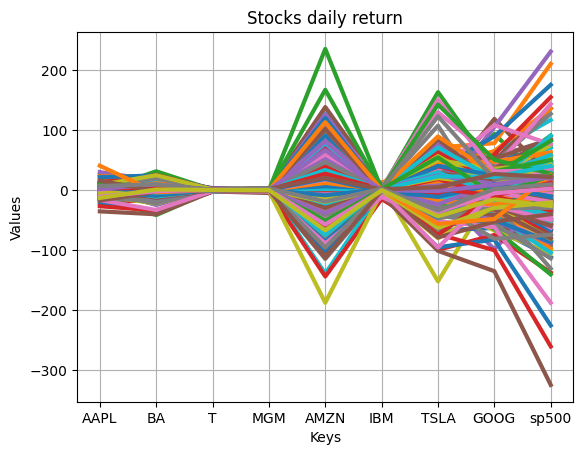

In [16]:
pltdic(dic,'Stocks daily return')

In [17]:
dailyR = pd.DataFrame(dic)
dailyR

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.225712,-0.910004,-0.050001,0.220000,2.490005,-1.389999,-5.459999,-2.316315,-6.410034
2,0.698571,0.640000,0.180000,-0.100000,3.240006,0.839996,3.809999,1.788300,4.580078
3,0.630001,-0.180000,0.080000,0.480000,7.779998,1.070007,0.209999,2.156921,14.369995
4,-0.194287,0.500000,0.090000,0.070000,5.009995,-0.550003,-0.049999,3.317566,6.459961
...,...,...,...,...,...,...,...,...,...
2154,1.589996,9.209992,-0.160000,0.000000,66.199951,-0.389999,-1.979980,8.640014,21.260010
2155,15.359985,-2.080002,-0.010000,1.740000,19.969971,0.670006,4.559936,26.489991,21.389892
2156,-11.159973,-2.179993,0.180000,0.570002,-57.540039,-1.160004,-36.869995,-5.609986,2.120117
2157,6.459992,9.390000,0.180001,2.619999,-19.300049,2.150002,-34.140015,1.609986,9.189942


In [18]:
cm = dailyR.corr()
cm

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
AAPL,1.000000,0.437339,0.377179,0.410819,0.581711,0.404860,0.375045,0.624556,0.747338
BA,0.437339,1.000000,0.346664,0.467788,0.337527,0.384730,0.243731,0.450661,0.624000
T,0.377179,0.346664,1.000000,0.327040,0.226553,0.423034,0.164653,0.368078,0.596766
MGM,0.410819,0.467788,0.327040,1.000000,0.331637,0.391885,0.250715,0.490132,0.613808
AMZN,0.581711,0.337527,0.226553,0.331637,1.000000,0.315790,0.412009,0.637808,0.586242
IBM,0.404860,0.384730,0.423034,0.391885,0.315790,1.000000,0.207462,0.434213,0.626597
TSLA,0.375045,0.243731,0.164653,0.250715,0.412009,0.207462,1.000000,0.386174,0.404564
GOOG,0.624556,0.450661,0.368078,0.490132,0.637808,0.434213,0.386174,1.000000,0.753683
sp500,0.747338,0.624000,0.596766,0.613808,0.586242,0.626597,0.404564,0.753683,1.000000


<AxesSubplot: >

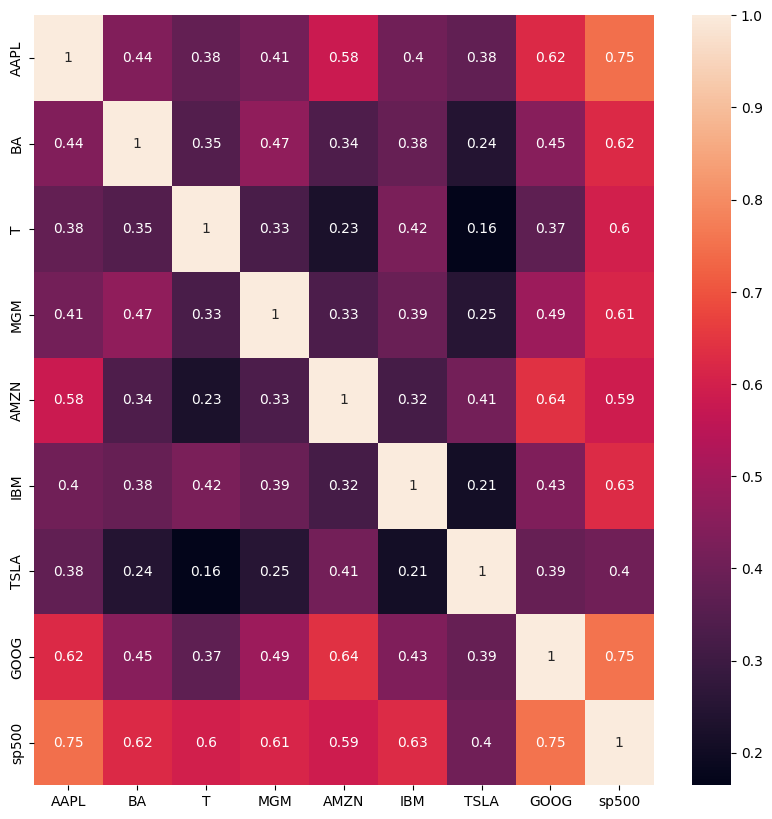

In [19]:
plt.figure(figsize=(10,10))
sns.heatmap(cm,annot=True)

In [20]:
cm['BA'].nlargest(2)

BA       1.000
sp500    0.624
Name: BA, dtype: float64

In [21]:
random_decimals = np.random.dirichlet(np.ones(9))

In [22]:
print(sum(random_decimals))
print(random_decimals)

1.0
[0.00444283 0.02192732 0.28154515 0.04219962 0.23015045 0.04796441
 0.19056347 0.11311166 0.0680951 ]


In [23]:
df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [24]:
portfolio = df.copy()

In [25]:
portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [26]:
x = random_decimals*1000000

In [27]:
j = 0
for i in portfolio.columns[1:]:
    val = portfolio[i][0]
    invested = random_decimals[j]*1000000
    stocks = invested / val
    print(f"Stock Value: {int(val)} \n Amount Invested: {int(invested)} Number of Stocks {int(stocks)}")
    j+=1

Stock Value: 60 
 Amount Invested: 4442 Number of Stocks 73
Stock Value: 75 
 Amount Invested: 21927 Number of Stocks 290
Stock Value: 30 
 Amount Invested: 281545 Number of Stocks 9347
Stock Value: 12 
 Amount Invested: 42199 Number of Stocks 3478
Stock Value: 175 
 Amount Invested: 230150 Number of Stocks 1308
Stock Value: 180 
 Amount Invested: 47964 Number of Stocks 265
Stock Value: 28 
 Amount Invested: 190563 Number of Stocks 6745
Stock Value: 313 
 Amount Invested: 113111 Number of Stocks 360
Stock Value: 1295 
 Amount Invested: 68095 Number of Stocks 52


In [28]:
capital = 10**6
investing = random_decimals*capital
investing

array([  4442.82666071,  21927.31719704, 281545.14921809,  42199.61865672,
       230150.45364978,  47964.40802088, 190563.4668801 , 113111.66150472,
        68095.09821196])

In [29]:
j = 0
for i in portfolio.iloc[:,1:]:
    portfolio[i] = round((portfolio[i] * investing[j])/portfolio[i][0])
    j+=1

In [30]:
portfolio.iloc[:1,1:]

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,4443.0,21927.0,281545.0,42200.0,230150.0,47964.0,190563.0,113112.0,68095.0


In [31]:
portfolio['Value'] = portfolio.drop("Date",axis=1).sum(axis=1)
portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,Value
0,2012-01-12,4443.0,21927.0,281545.0,42200.0,230150.0,47964.0,190563.0,113112.0,68095.0,999999.0
1,2012-01-13,4426.0,21663.0,281078.0,42965.0,233408.0,47595.0,153732.0,112276.0,67758.0,964901.0
2,2012-01-17,4478.0,21849.0,282760.0,42617.0,237646.0,47818.0,179433.0,112921.0,67999.0,997521.0
3,2012-01-18,4524.0,21797.0,283508.0,44287.0,247824.0,48103.0,180850.0,113699.0,68754.0,1013346.0
4,2012-01-19,4510.0,21942.0,284349.0,44531.0,254378.0,47956.0,180513.0,114896.0,69094.0,1022169.0
...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,32492.0,50609.0,279021.0,58168.0,4192799.0,33327.0,10017365.0,531438.0,174917.0,15370136.0
2155,2020-08-06,33625.0,50005.0,278928.0,64221.0,4218924.0,33505.0,10048125.0,540991.0,176041.0,15444365.0
2156,2020-08-07,32802.0,49372.0,280610.0,66204.0,4143650.0,33197.0,9799414.0,538968.0,176153.0,15120370.0
2157,2020-08-10,33278.0,52099.0,282293.0,75319.0,4118402.0,33768.0,9569119.0,539548.0,176636.0,14880462.0


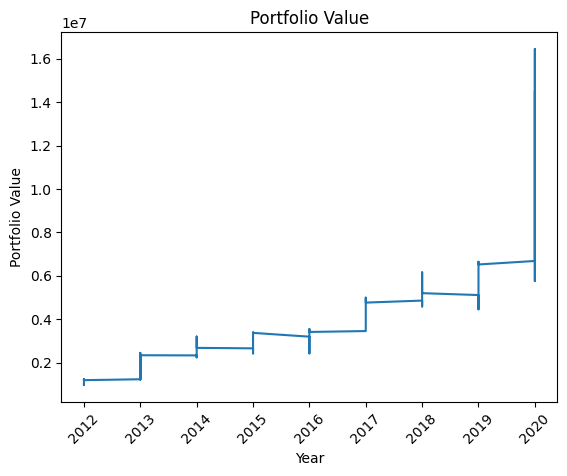

In [32]:
portfolio['Date'] = pd.to_datetime(portfolio['Date'])
portfolio['Year'] = portfolio['Date'].dt.year
plt.plot(portfolio['Year'], portfolio['Value'])
plt.xlabel('Year')
plt.ylabel('Portfolio Value')
plt.title('Portfolio Value')
plt.xticks(rotation=45) 
plt.show()

In [33]:
def calc_daily_return(stock,dfs=df):
    val = []
    dfs[stock]
    for i in range(1,len(dfs)):
        val.append(dfs[stock][i]-dfs[stock][i-1])
    return val

def calc_profit_return(stock,dfs=df):
    return dfs[stock][len(dfs)-1]-dfs[stock][0]

In [34]:
portfolio['Daily Return'] = 0.000
portfolio['Profit'] = 0.000
for i in range(1,len(portfolio)):
    portfolio['Daily Return'][i] = (portfolio['Value'][i] - portfolio['Value'][i-1])
    portfolio['Profit'][i] = (portfolio['Value'][i] - portfolio['Value'][0])
portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,Value,Year,Daily Return,Profit
0,2012-01-12,4443.0,21927.0,281545.0,42200.0,230150.0,47964.0,190563.0,113112.0,68095.0,999999.0,2012,0.0,0.0
1,2012-01-13,4426.0,21663.0,281078.0,42965.0,233408.0,47595.0,153732.0,112276.0,67758.0,964901.0,2012,-35098.0,-35098.0
2,2012-01-17,4478.0,21849.0,282760.0,42617.0,237646.0,47818.0,179433.0,112921.0,67999.0,997521.0,2012,32620.0,-2478.0
3,2012-01-18,4524.0,21797.0,283508.0,44287.0,247824.0,48103.0,180850.0,113699.0,68754.0,1013346.0,2012,15825.0,13347.0
4,2012-01-19,4510.0,21942.0,284349.0,44531.0,254378.0,47956.0,180513.0,114896.0,69094.0,1022169.0,2012,8823.0,22170.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,32492.0,50609.0,279021.0,58168.0,4192799.0,33327.0,10017365.0,531438.0,174917.0,15370136.0,2020,78673.0,14370137.0
2155,2020-08-06,33625.0,50005.0,278928.0,64221.0,4218924.0,33505.0,10048125.0,540991.0,176041.0,15444365.0,2020,74229.0,14444366.0
2156,2020-08-07,32802.0,49372.0,280610.0,66204.0,4143650.0,33197.0,9799414.0,538968.0,176153.0,15120370.0,2020,-323995.0,14120371.0
2157,2020-08-10,33278.0,52099.0,282293.0,75319.0,4118402.0,33768.0,9569119.0,539548.0,176636.0,14880462.0,2020,-239908.0,13880463.0


In [35]:
cummulative_return = portfolio['Value'].iloc[-1] - portfolio['Value'].iloc[0]
print ("{:,.0f}".format(cummulative_return))

13,485,656


In [36]:
print("Standard Deviation of the Portfolio is {:.2f}".format(portfolio['Daily Return'].std()))

Standard Deviation of the Portfolio is 118722.86


In [37]:
print("Average Daily Return of the portfolio is {:.2f}%".format(portfolio['Daily Return'].mean()/100))

Average Daily Return of the portfolio is 62.46%


In [38]:
portfolio['Daily Return']

0            0.0
1       -35098.0
2        32620.0
3        15825.0
4         8823.0
          ...   
2154     78673.0
2155     74229.0
2156   -323995.0
2157   -239908.0
2158   -394807.0
Name: Daily Return, Length: 2159, dtype: float64

In [39]:
sharpe_ratio = portfolio['Daily Return'].mean() / portfolio['Daily Return'].std()* np.sqrt(252)
print(f"Sharpe Ratio of the Portfolio {sharpe_ratio:.2f}%")

Sharpe Ratio of the Portfolio 0.84%


In [40]:
portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,Value,Year,Daily Return,Profit
0,2012-01-12,4443.0,21927.0,281545.0,42200.0,230150.0,47964.0,190563.0,113112.0,68095.0,999999.0,2012,0.0,0.0
1,2012-01-13,4426.0,21663.0,281078.0,42965.0,233408.0,47595.0,153732.0,112276.0,67758.0,964901.0,2012,-35098.0,-35098.0
2,2012-01-17,4478.0,21849.0,282760.0,42617.0,237646.0,47818.0,179433.0,112921.0,67999.0,997521.0,2012,32620.0,-2478.0
3,2012-01-18,4524.0,21797.0,283508.0,44287.0,247824.0,48103.0,180850.0,113699.0,68754.0,1013346.0,2012,15825.0,13347.0
4,2012-01-19,4510.0,21942.0,284349.0,44531.0,254378.0,47956.0,180513.0,114896.0,69094.0,1022169.0,2012,8823.0,22170.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,32492.0,50609.0,279021.0,58168.0,4192799.0,33327.0,10017365.0,531438.0,174917.0,15370136.0,2020,78673.0,14370137.0
2155,2020-08-06,33625.0,50005.0,278928.0,64221.0,4218924.0,33505.0,10048125.0,540991.0,176041.0,15444365.0,2020,74229.0,14444366.0
2156,2020-08-07,32802.0,49372.0,280610.0,66204.0,4143650.0,33197.0,9799414.0,538968.0,176153.0,15120370.0,2020,-323995.0,14120371.0
2157,2020-08-10,33278.0,52099.0,282293.0,75319.0,4118402.0,33768.0,9569119.0,539548.0,176636.0,14880462.0,2020,-239908.0,13880463.0


In [41]:
portfolio['Change%'] = 0
portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,Value,Year,Daily Return,Profit,Change%
0,2012-01-12,4443.0,21927.0,281545.0,42200.0,230150.0,47964.0,190563.0,113112.0,68095.0,999999.0,2012,0.0,0.0,0
1,2012-01-13,4426.0,21663.0,281078.0,42965.0,233408.0,47595.0,153732.0,112276.0,67758.0,964901.0,2012,-35098.0,-35098.0,0
2,2012-01-17,4478.0,21849.0,282760.0,42617.0,237646.0,47818.0,179433.0,112921.0,67999.0,997521.0,2012,32620.0,-2478.0,0
3,2012-01-18,4524.0,21797.0,283508.0,44287.0,247824.0,48103.0,180850.0,113699.0,68754.0,1013346.0,2012,15825.0,13347.0,0
4,2012-01-19,4510.0,21942.0,284349.0,44531.0,254378.0,47956.0,180513.0,114896.0,69094.0,1022169.0,2012,8823.0,22170.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,32492.0,50609.0,279021.0,58168.0,4192799.0,33327.0,10017365.0,531438.0,174917.0,15370136.0,2020,78673.0,14370137.0,0
2155,2020-08-06,33625.0,50005.0,278928.0,64221.0,4218924.0,33505.0,10048125.0,540991.0,176041.0,15444365.0,2020,74229.0,14444366.0,0
2156,2020-08-07,32802.0,49372.0,280610.0,66204.0,4143650.0,33197.0,9799414.0,538968.0,176153.0,15120370.0,2020,-323995.0,14120371.0,0
2157,2020-08-10,33278.0,52099.0,282293.0,75319.0,4118402.0,33768.0,9569119.0,539548.0,176636.0,14880462.0,2020,-239908.0,13880463.0,0


In [42]:
for i in range(1,len(portfolio)):
    portfolio['Change%'][i] = (portfolio['Value'][i] / portfolio['Value'][i-1])-1
portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,Value,Year,Daily Return,Profit,Change%
0,2012-01-12,4443.0,21927.0,281545.0,42200.0,230150.0,47964.0,190563.0,113112.0,68095.0,999999.0,2012,0.0,0.0,0.000000
1,2012-01-13,4426.0,21663.0,281078.0,42965.0,233408.0,47595.0,153732.0,112276.0,67758.0,964901.0,2012,-35098.0,-35098.0,-0.035098
2,2012-01-17,4478.0,21849.0,282760.0,42617.0,237646.0,47818.0,179433.0,112921.0,67999.0,997521.0,2012,32620.0,-2478.0,0.033807
3,2012-01-18,4524.0,21797.0,283508.0,44287.0,247824.0,48103.0,180850.0,113699.0,68754.0,1013346.0,2012,15825.0,13347.0,0.015864
4,2012-01-19,4510.0,21942.0,284349.0,44531.0,254378.0,47956.0,180513.0,114896.0,69094.0,1022169.0,2012,8823.0,22170.0,0.008707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,32492.0,50609.0,279021.0,58168.0,4192799.0,33327.0,10017365.0,531438.0,174917.0,15370136.0,2020,78673.0,14370137.0,0.005145
2155,2020-08-06,33625.0,50005.0,278928.0,64221.0,4218924.0,33505.0,10048125.0,540991.0,176041.0,15444365.0,2020,74229.0,14444366.0,0.004829
2156,2020-08-07,32802.0,49372.0,280610.0,66204.0,4143650.0,33197.0,9799414.0,538968.0,176153.0,15120370.0,2020,-323995.0,14120371.0,-0.020978
2157,2020-08-10,33278.0,52099.0,282293.0,75319.0,4118402.0,33768.0,9569119.0,539548.0,176636.0,14880462.0,2020,-239908.0,13880463.0,-0.015867


In [43]:
print(calc_daily_return("sp500"))

[-6.410033999999996, 4.580077999999958, 14.369995000000017, 6.459961000000021, 0.8800049999999828, 0.6199950000000172, -1.3499759999999696, 11.41003499999988, -7.630004999999983, -2.100097999999889, -3.3199460000000727, -0.5999759999999696, 11.679932000000008, 1.4500729999999749, 19.35998500000005, -0.570067999999992, 2.720092999999906, 2.9099120000000767, 1.9899900000000343, -9.309936000000107, 9.130004999999983, -1.2700199999999313, -7.270019999999931, 14.81005899999991, 3.18994100000009, 0.9799809999999525, -4.549927000000025, 5.799927000000025, 2.280029000000013, 1.8499759999999696, 4.590087999999923, -6.5, 8.409912000000077, -4.459961000000021, -5.3000489999999445, -20.969970999999987, 9.270019999999931, 13.280029000000013, 4.959961000000021, 0.21997099999998682, 24.85998500000005, -1.6699220000000423, 8.319946999999956, 1.570067999999992, 5.579956000000038, -4.229980000000069, -2.630004999999983, -10.109985999999935, 4.329956000000038, 19.400024999999914, -3.9899900000000343, -6.

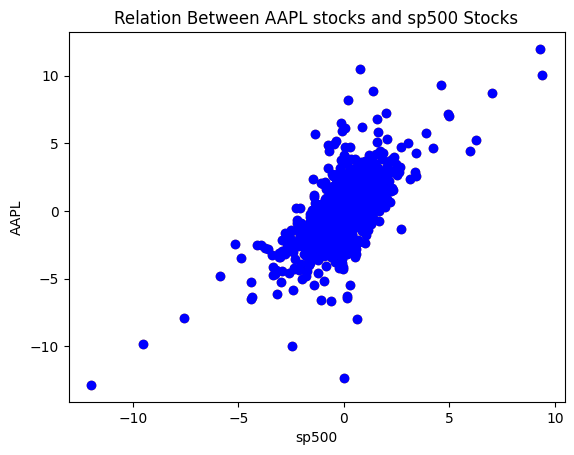

In [44]:
sp500_returns = daily_return_df["sp500"]
aapl_returns = daily_return_df["AAPL"]

plt.scatter(sp500_returns, aapl_returns, color='orange', label='sp500')
plt.scatter(sp500_returns, aapl_returns, color='blue', label='AAPL')

plt.xlabel('sp500')
plt.ylabel('AAPL')
plt.title('Relation Between AAPL stocks and sp500 Stocks')

plt.show()

In [45]:
beta,alpha = np.polyfit(sp500_returns,aapl_returns,1)
print(f"beta for AAPL is {beta:.2f} and alpha is {alpha:.2f} ")

beta for AAPL is 1.11 and alpha is 0.05 


In [46]:
rm = daily_return_df['sp500'].mean()*252
rm

12.427633663298055

In [47]:
rf = 0
ER_APPL = rf + (beta*(rm-rf))
ER_APPL

13.830619238640269

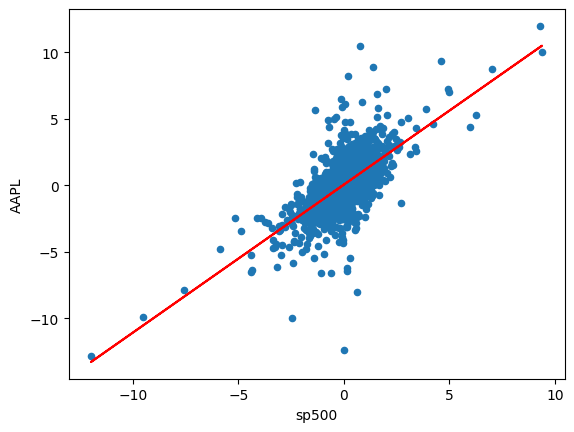

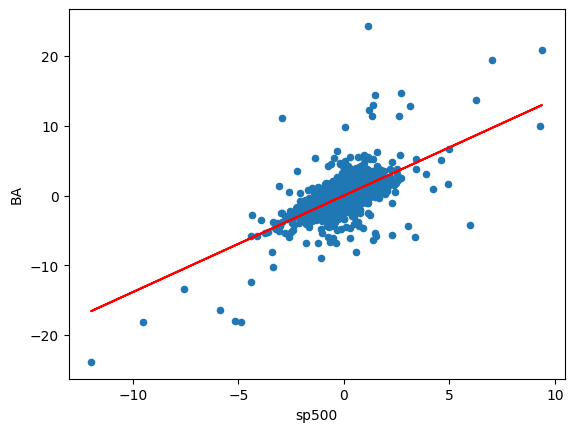

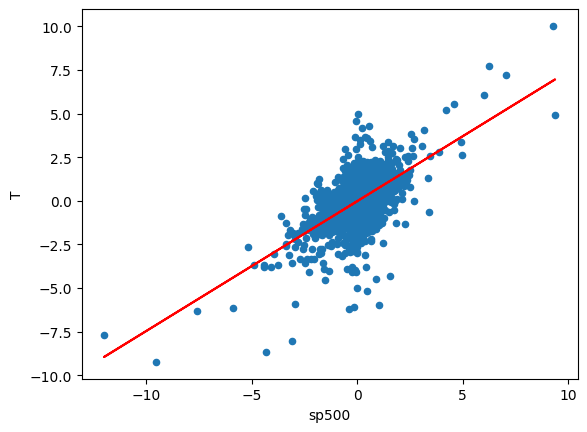

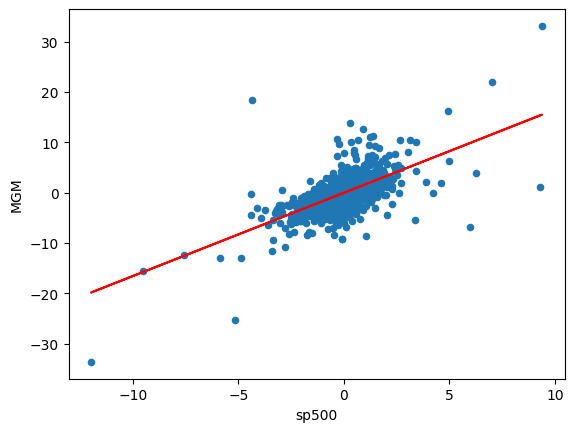

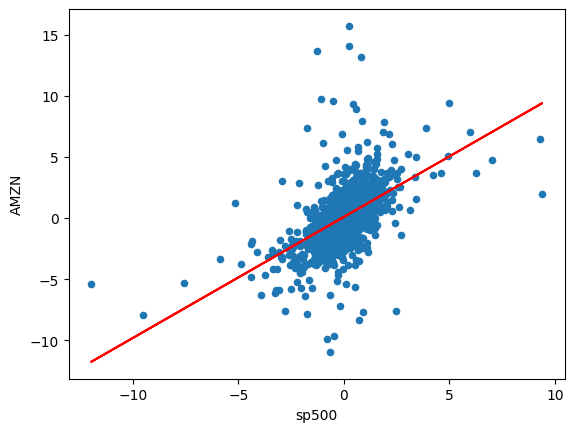

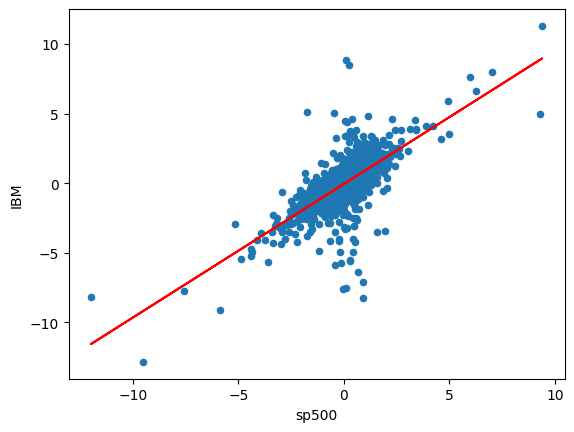

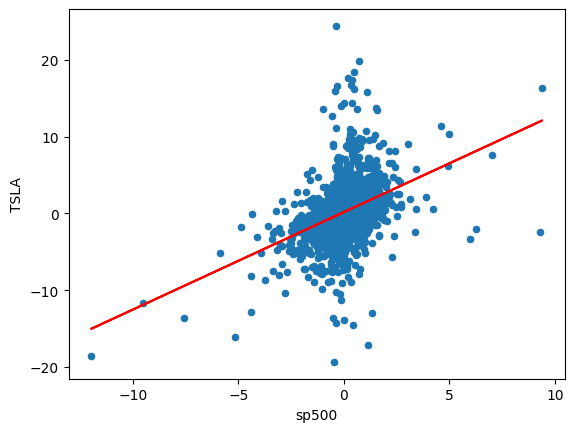

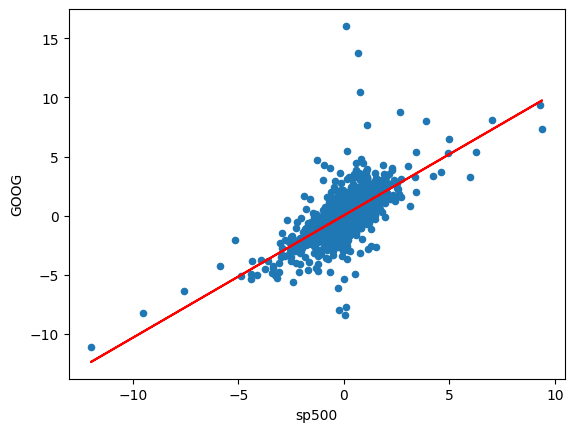

In [48]:
alpha = {}
beta = {}
for i in daily_return_df.columns[1:]:
    if i == 'sp500':
        continue
    else:
        daily_return_df.plot(kind='scatter',x='sp500',y=i)
        b,a = np.polyfit(daily_return_df['sp500'],daily_return_df[i],1)
        plt.plot(daily_return_df['sp500'],b*daily_return_df['sp500']+a,'-',color='r')
        beta[i] = b
        alpha[i] = a

In [49]:
beta

{'AAPL': 1.1128924148678108,
 'BA': 1.3828672010892782,
 'T': 0.744629345474785,
 'MGM': 1.6535677065180119,
 'AMZN': 0.9917345712576854,
 'IBM': 0.9604149148095252,
 'TSLA': 1.2686150101095914,
 'GOOG': 1.0348817687428566}

In [50]:
alpha

{'AAPL': 0.052812084694402746,
 'BA': -0.0022906983297535394,
 'T': -0.028563430198461717,
 'MGM': -0.016885305520478865,
 'AMZN': 0.10221396417765219,
 'IBM': -0.05345494150445125,
 'TSLA': 0.17583492165165862,
 'GOOG': 0.03335558721467006}

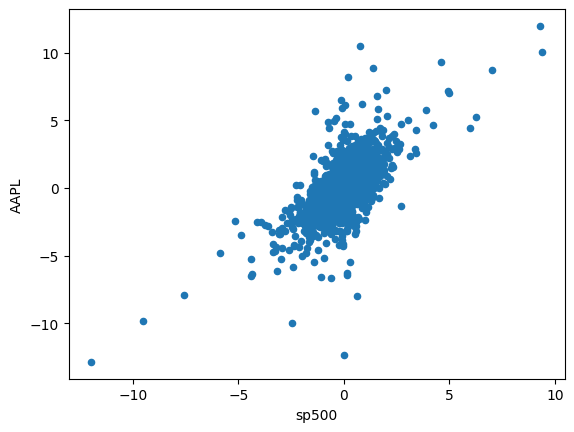

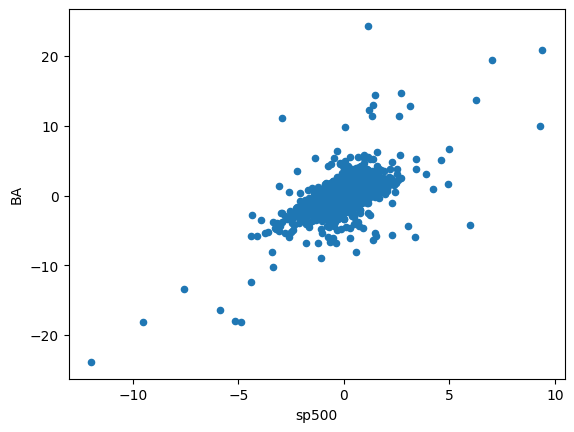

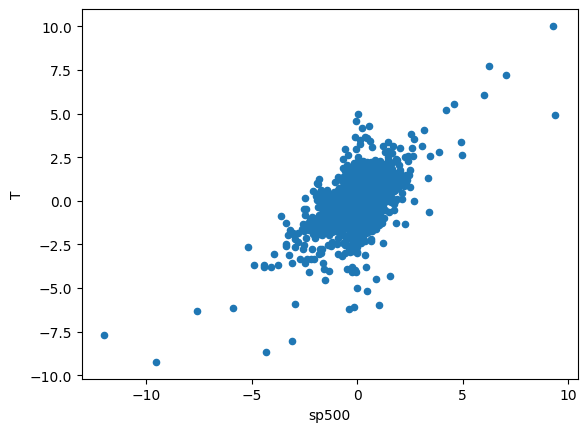

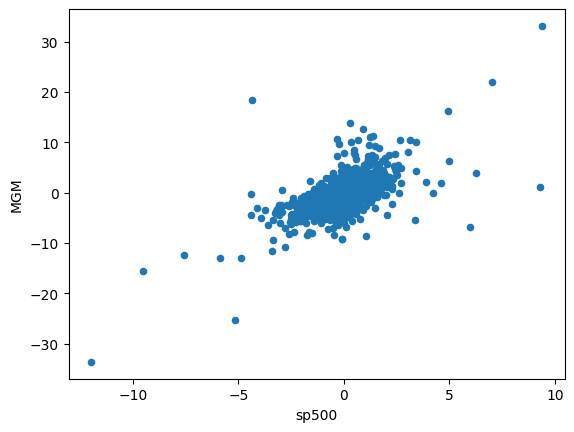

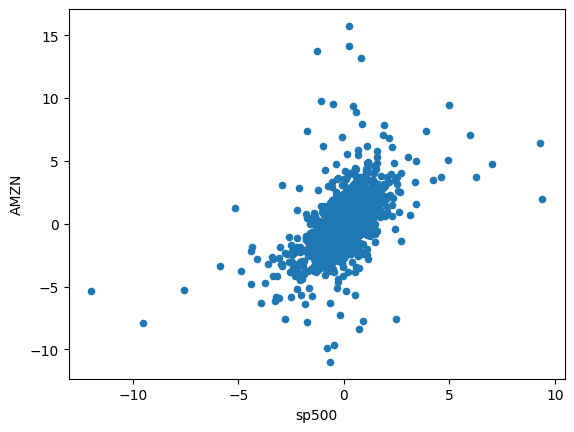

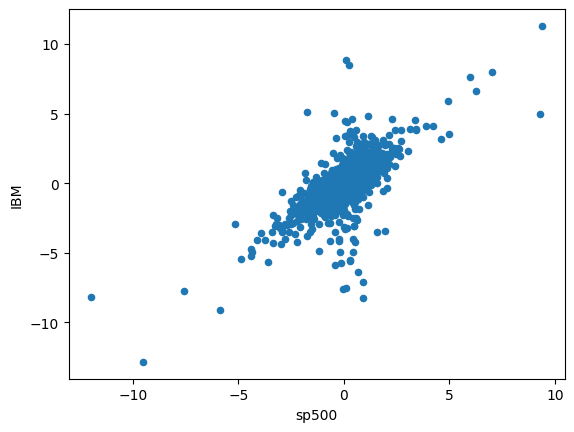

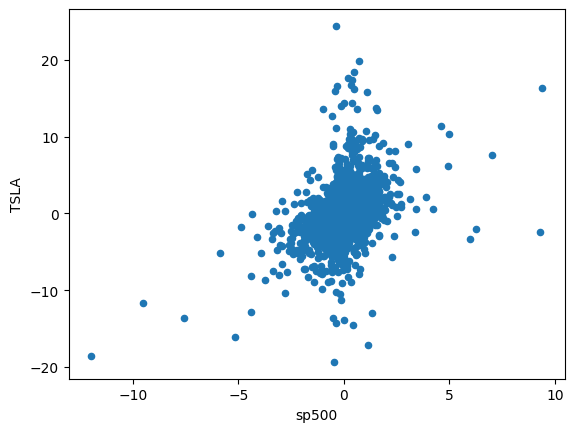

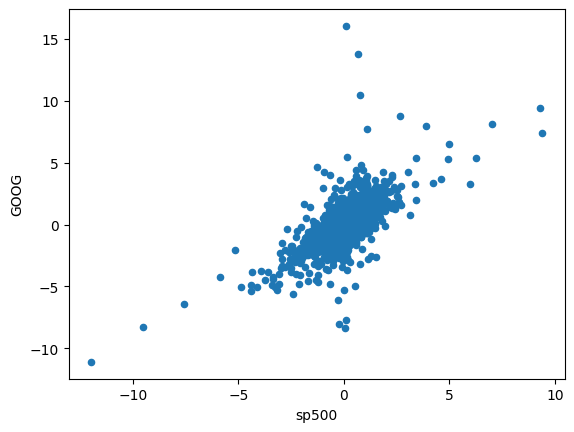

In [51]:
for i in daily_return_df.columns[1:]:
    if i == 'sp500':
        continue
    else:
        fig = px.scatter(daily_return_df,x='sp500',y=i,title=i)
        daily_return_df.plot(kind='scatter',x='sp500',y=i)
        b,a = np.polyfit(daily_return_df['sp500'],daily_return_df[i],1)
        fig.add_scatter(x=daily_return_df['sp500'],y=b*daily_return_df['sp500']+a)
        fig.show()

In [52]:
keys = list(beta.keys())
keys

['AAPL', 'BA', 'T', 'MGM', 'AMZN', 'IBM', 'TSLA', 'GOOG']

In [53]:
ER = {}
rf = 0
rm = daily_return_df['sp500'].mean() * 252
for i in keys:
    ER[i] = rf+(beta[i]*(rm-rf))

In [54]:
for i in keys:
    print("Expected Return based on CAPM for {} is {:.2f}%".format(i,ER[i]))

Expected Return based on CAPM for AAPL is 13.83%
Expected Return based on CAPM for BA is 17.19%
Expected Return based on CAPM for T is 9.25%
Expected Return based on CAPM for MGM is 20.55%
Expected Return based on CAPM for AMZN is 12.32%
Expected Return based on CAPM for IBM is 11.94%
Expected Return based on CAPM for TSLA is 15.77%
Expected Return based on CAPM for GOOG is 12.86%


In [55]:
portfolio_weight = 1/len(keys) * np.ones(len(keys))
portfolio_weight

array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])

In [56]:
ER_portfolio = sum(list(ER.values())*portfolio_weight)
ER_portfolio

14.21348917679252

In [57]:
stocks_vol = pd.read_csv("stock-volume.csv").sort_values('Date')
stocks_vol

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [58]:
stocks_vol.isnull().sum().sum()

0

In [59]:
stocks_vol.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03
mean,5.820332e+07,6.419916e+06,2.832131e+07,9.845582e+06,4.102673e+06,4.453090e+06,7.001302e+06,2.498238e+06,3.680732e+09
std,4.568141e+07,9.711873e+06,1.428911e+07,7.295753e+06,2.290722e+06,2.462811e+06,5.781208e+06,1.928407e+06,8.622717e+08
min,1.136200e+07,7.889000e+05,6.862400e+06,9.507000e+05,8.813000e+05,1.193000e+06,3.649000e+05,7.900000e+03,1.248960e+09
25%,2.769930e+07,3.031850e+06,2.002150e+07,5.796450e+06,2.675700e+06,3.111250e+06,3.433450e+06,1.325400e+06,3.211890e+09
50%,4.209420e+07,3.991000e+06,2.485930e+07,7.899800e+06,3.494800e+06,3.825000e+06,5.581100e+06,1.813900e+06,3.526890e+09
75%,7.182480e+07,5.325900e+06,3.210565e+07,1.104055e+07,4.768150e+06,4.937300e+06,8.619550e+06,3.245350e+06,3.933290e+09
max,3.765300e+08,1.032128e+08,1.950827e+08,9.009820e+07,2.385610e+07,3.049020e+07,6.093880e+07,2.497790e+07,9.044690e+09


In [60]:
interactive_plt(stocks_vol,'Stocks Volume')

In [61]:
def normalize(dfs):
    x=dfs.copy()
    for i in x.columns[1:]:
        x[i] = x[i] / x[i][0]
    return x

In [62]:
interactive_plt(df,'Stocks Prices')

In [63]:
interactive_plot(stocks_vol,'Stocks Volume')

In [64]:
interactive_plot(normalize(df),'Normalized Prices')

In [65]:
interactive_plot(normalize(stocks_vol),'Normalized Stocks Volume')

In [66]:
def stock_analysis(price_df,vol_df,name):
    return pd.DataFrame(
        {'Date' :price_df['Date'],
           'Close':price_df[name],
           'Volume':vol_df[name],})
def trading_window(data):
    n = 1
    data['Target'] = data[['Close']].shift(-n)
    return data

In [67]:
price_vol_df = stock_analysis(df,stocks_vol,'AAPL')
price_vol_df

,Date,Close,Volume
0,2012-01-12,60.198570,53146800
1,2012-01-13,59.972858,56505400
2,2012-01-17,60.671429,60724300
3,2012-01-18,61.301430,69197800
4,2012-01-19,61.107143,65434600
...,...,...,...
2154,2020-08-05,440.250000,30498000
2155,2020-08-06,455.609985,50607200
2156,2020-08-07,444.450012,49453300
2157,2020-08-10,450.910004,53100900


In [68]:
price_vol_target_df = trading_window(price_vol_df)
price_vol_target_df = price_vol_target_df[:-1]
price_vol_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2153,2020-08-04,438.660004,43267900,440.250000
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004


In [69]:
sc = MinMaxScaler(feature_range=(0,1))
price_vol_target_scaled_df = sc.fit_transform(price_vol_target_df.drop(columns=['Date']))

In [70]:
price_vol_target_scaled_df

array([[0.01102638, 0.11442624, 0.01046185],
       [0.01046185, 0.12362365, 0.01220906],
       [0.01220906, 0.13517696, 0.01378478],
       ...,
       [1.        , 0.10747163, 0.97208751],
       [0.97208751, 0.10431171, 0.98824476],
       [0.98824476, 0.11430054, 0.95470465]])

In [71]:
price_vol_target_scaled_df.shape

(2158, 3)

In [72]:
X =price_vol_target_scaled_df[:,:2]
Y = price_vol_target_scaled_df[:,-1]

In [73]:
X

array([[0.01102638, 0.11442624],
       [0.01046185, 0.12362365],
       [0.01220906, 0.13517696],
       ...,
       [1.        , 0.10747163],
       [0.97208751, 0.10431171],
       [0.98824476, 0.11430054]])

In [74]:
Y

array([0.01046185, 0.01220906, 0.01378478, ..., 0.97208751, 0.98824476,
       0.95470465])

In [75]:
print(X.shape)
print(Y.shape)

(2158, 2)
(2158,)


In [76]:
tr = int(.75*len(X))

In [77]:
Xtrain = X[:tr]
Xtest = X[tr:]
Ytrain = Y[:tr]
Ytest = Y[tr:]

In [78]:
print( 
Xtrain.shape,'\n',
Xtest.shape,'\n',
Ytrain.shape,'\n',
Ytest.shape,'\n',)

(1618, 2) 
 (540, 2) 
 (1618,) 
 (540,) 



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


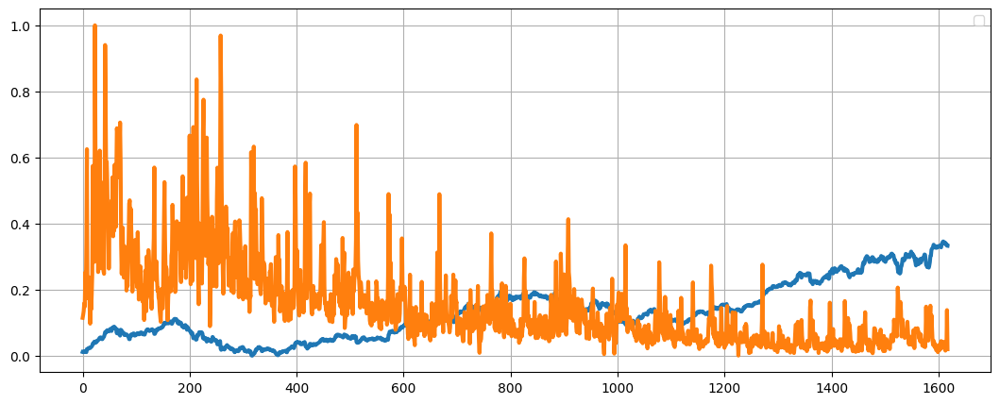

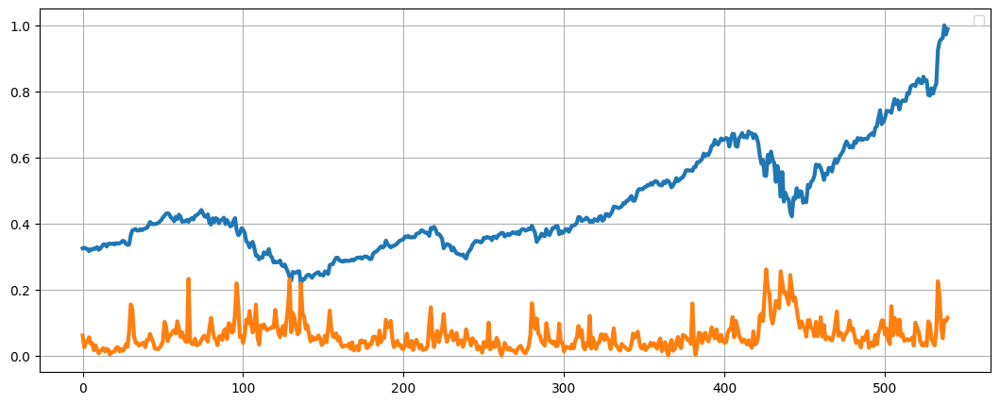

In [79]:
def showplot(data,title):
    plt.figure(figsize=(13,5))
    plt.plot(data,linewidth=3)
    plt.title=(title)
    plt.legend()
    plt.grid()
    
    
showplot(Xtrain,'Training Data')
showplot(Xtest,'Testing Data')

In [80]:
reg = Ridge()
reg.fit(Xtrain,Ytrain)

Ridge()

In [81]:
reg_acc = reg.score(Xtest,Ytest)
print(round(reg_acc,2))

0.93


In [82]:
pred_df = pd.DataFrame()
pred_df['target'] = Ytest
pred_df['pred'] = reg.predict(Xtest)
pred_df['diff'] = pred_df['target'] - pred_df['pred'] 
pred_df['diff%'] = pred_df['diff'] / pred_df['target']
pred_df

,target,pred,diff,diff%
0,0.326922,0.306639,0.020284,0.062044
1,0.324321,0.309814,0.014507,0.044731
2,0.322970,0.306966,0.016004,0.049552
3,0.316092,0.305610,0.010482,0.033161
4,0.321745,0.299037,0.022708,0.070576
...,...,...,...,...
535,0.961583,0.866550,0.095033,0.098830
536,1.000000,0.871436,0.128564,0.128564
537,0.972088,0.903353,0.068734,0.070708
538,0.988245,0.878730,0.109515,0.110818


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


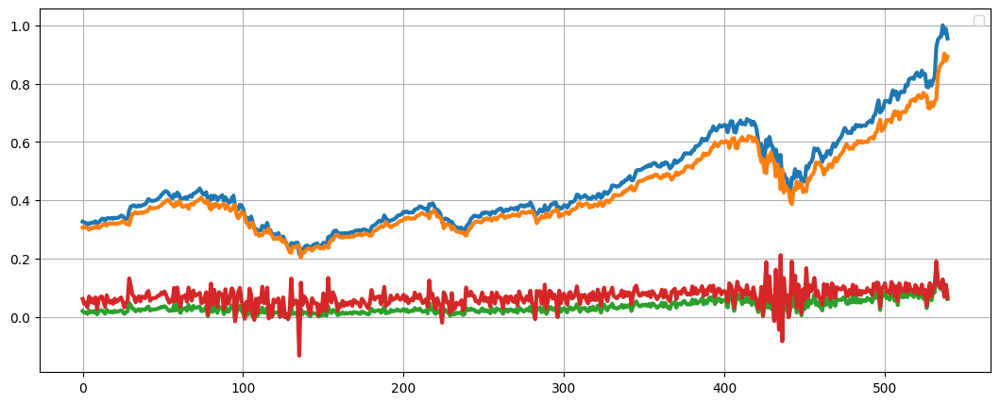

In [83]:
showplot(pred_df,'Original vs Pred')

In [84]:
mse = mean_squared_error(Ytest, pred_df['pred'])
mse

0.0017350105834664836